# Spatial Analysis
---

In [1]:
import matplotlib.pyplot as plt

# font
plt.rcParams['font.sans-serif'] = ['Arial']
LABEL_FONT = {
    "fontsize": 12,
    "weight": "bold",
}    

# colors
BLUE = '#2878B5'
LIGHTBLUE = '#9AC9DB'
ORANGE = '#F8AC8C'
RED = '#C82423'
PINK = '#FF8884'
GREY = '#9E9E9E'
DEEPGREEN = '#32B897'
GREEN = '#96CCCB'

plt.rcParams['figure.dpi'] = 300

In [2]:
from analysis import Aggregator

# bins
agg = Aggregator()
SPEED_BIN = agg.SPEED_BIN
ACC_BIN = agg.ACC_BIN
DECEL_BIN = agg.BRAKE_DECEL_BIN
VSP_BIN = agg.VSP_BIN

import numpy as np
OpModeERs = np.load("./data/agg/OpModeERs.npy")

## 1 Geo Data Preparation

### 1.1 Extract roadnet as GeoDataFrame

In [ ]:
# get road network from a bounding box
import osmnx as ox

north, south, east, west = 30.735, 30.650, 104.133, 104.034,

custom_filter = ('["highway"]["area"!~"yes"]["access"!~"private"]'
                 '["highway"!~"abandoned|bridleway|bus_guideway|construction|corridor|cycleway|'
                 'elevator|escalator|footway|path|pedestrian|planned|platform|proposed|raceway|steps|track"]'
                 '["service"!~"emergency_access|private"]')
graph = ox.graph_from_bbox(
    north, south, east, west,
    simplify=True,
    custom_filter=custom_filter,
)
# ox.plot_graph(graph, node_size=0, figsize=(6,6))

# save as GeoDataFrame
roadnet = ox.graph_to_gdfs(graph, nodes=False)
roadnet = roadnet.explode('osmid')

### 1.2 Simplify the roadnet by merging

In [6]:
# step1: merge highway type
roadnet_merge = roadnet.copy()

# define road type orders
highway_types = ["motorway", "trunk", "primary", "secondary", "tertiary", "unclassified", "residential",
                 "motorway_link", "trunk_link", "primary_link", "secondary_link", "tertiary_link", "living_street",
                 "service"]

def highway_merge(highway):
    if type(highway) == str:
        return highway
    else:
        # if there are two or more than highway types in the list, return the one with the highest class
        index = [highway_types.index(i) for i in highway]
        return highway[np.argmin(index)]
# merge
roadnet_merge['highway'] = roadnet['highway'].apply(highway_merge)

In [7]:
import pandas as pd
from tqdm import tqdm
from shapely import ops, multilinestrings

# step2: merge geometry
roadnet_simplified = {"osmid":[], "road type":[], "geometry":[], "length":[]}

for osmid in tqdm(roadnet_merge.osmid.unique()):
    
    road = roadnet_merge[roadnet_merge["osmid"] == osmid]

    # add osmid
    roadnet_simplified["osmid"].append(osmid)

    # add road type
    roadTypes = road["highway"].tolist()
    # get the count of each type
    typeCounts = {t:roadTypes.count(t) for t in set(roadTypes)}
    # get the type with the most count
    maxTypes = [t for t in typeCounts.keys() if typeCounts[t] == max(typeCounts.values())]
    # if there are more than two types, return the one with the highest class
    roadnet_simplified["road type"].append(roadTypes[np.argmin([highway_types.index(i) for i in roadTypes])])

    # add geometry
    roadnet_simplified["geometry"].append(ops.linemerge(multilinestrings(road["geometry"].to_list())))
    
    # add length
    roadnet_simplified["length"].append(road["length"].sum())

roadnet_simplified = pd.DataFrame(roadnet_simplified)
roadnet_simplified

  0%|          | 0/3424 [00:00<?, ?it/s]

100%|██████████| 3424/3424 [00:07<00:00, 458.15it/s]


,osmid,road type,geometry,length
0,28623889,unclassified,"MULTILINESTRING ((104.100294 30.7147948, 104.1...",388.748
1,137133120,primary,"LINESTRING (104.0962794 30.7083293, 104.097185...",1089.647
2,184296328,tertiary,"MULTILINESTRING ((104.084002 30.6897702, 104.0...",636.872
3,184255152,primary,"LINESTRING (104.0867707 30.6942493, 104.086242...",1213.291
4,132627766,primary,"LINESTRING (104.080525 30.6847522, 104.0807094...",882.906
...,...,...,...,...
3419,1239442685,service,"LINESTRING (104.0807465 30.7265347, 104.083157...",475.750
3420,1239442686,service,"LINESTRING (104.0806705 30.7263843, 104.083040...",467.784
3421,1239442687,service,"LINESTRING (104.0805851 30.7262155, 104.082916...",459.724
3422,1239442688,service,"LINESTRING (104.0805049 30.7260567, 104.082789...",450.876


In [9]:
# save as shapefile
import geopandas as gpd
gdf = gpd.GeoDataFrame(roadnet_simplified, geometry="geometry")
# gdf.to_file("./data/geo/roadnet/roadnet_simplified.shp")

### 1.3 Intersection extraction

In [ ]:
# get road network from a bounding box
import osmnx as ox

north, south, east, west = 30.734674878580773, 30.650908445140583, 104.13222287837313, 104.03445064977247,
custom_filter = ('["highway"]["area"!~"yes"]["access"!~"private"]'
                 '["highway"!~"abandoned|bridleway|bus_guideway|construction|corridor|cycleway|'
                 'elevator|escalator|footway|path|pedestrian|planned|platform|proposed|raceway|steps|track"]'
                 '["service"!~"emergency_access|private"]')
graph = ox.graph_from_bbox(
    north, south, east, west,
    simplify=True,
    custom_filter=custom_filter,
)

# extract node to gdf
node, link = ox.graph_to_gdfs(graph)

# save as shapefile
import geopandas as gpd
gdf = gpd.GeoDataFrame(node, geometry="geometry")
# gdf.to_file("./data/geo/nodes/nodes.shp")

## 2 The study area

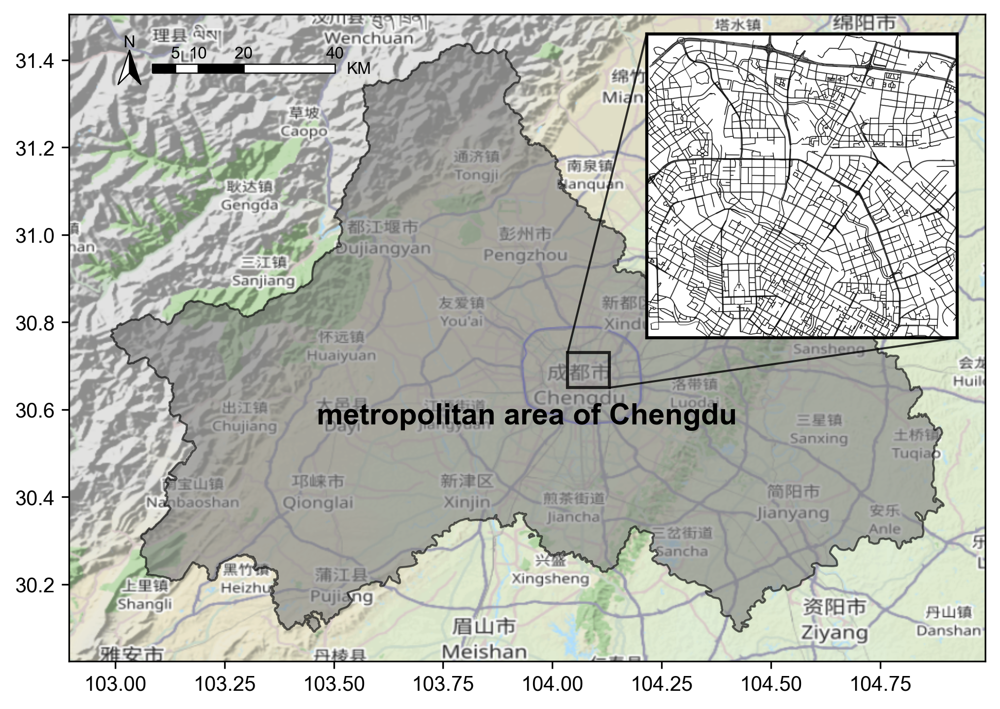

In [10]:
import contextily as ctx
import osmnx as ox
import transbigdata as tbd

# geo data preparation
Chengdu_bound = ox.geocode_to_gdf("Chengdu, Sichuan, China")  # bounding of Chengdu city
north, south, east, west = 30.73, 30.65, 104.13, 104.035
road_graph = ox.graph_from_bbox(north, south, east, west, network_type='drive')
road_graph = ox.graph_to_gdfs(road_graph, nodes=False)

fig, ax = plt.subplots(1, 1, figsize=(8,6))

# plot Chengdu bound
Chengdu_bound.plot(ax=ax, facecolor='GREY', edgecolor='k', alpha=0.6)
ctx.add_basemap(ax=ax, crs=Chengdu_bound.crs.to_string(), source='https://c.tile.thunderforest.com/cycle/{z}/{x}/{y}.png?apikey=41f4f936f1d148f69cbd100812875c88')
ax.text(0.5, 0.4, "metropolitan area of Chengdu", transform=ax.transAxes, fontweight='bold', fontsize='x-large', ha='center', va='top')

# plot road graph
ax_ = ax.inset_axes([0.55, 0.5, 0.5, 0.47], transform=ax.transAxes)
road_graph.plot(ax=ax_, facecolor=None, color='k', alpha=0.6, linewidth=0.4)
ax_.set_xlim(west, east)
ax_.set_ylim(south, north)
ax_.set_xticks([])
ax_.set_yticks([])
for loc in ['left', 'right', 'top', 'bottom']:
    ax_.spines[loc].set_color('k')
    ax_.spines[loc].set_linewidth(1.5)
ax.indicate_inset_zoom(ax_, edgecolor="black", alpha=0.8, linewidth=1.5)

# scale bar
tbd.plotscale(ax=ax, bounds=[west, south, east, north], accuracy=5000, rect=[-10, 9])

plt.show()

## 3 Spatial analysis

### 3.1 Link aggregation

In [11]:
import pickle
with open("./data/agg/agg_link.pkl", 'rb') as f:
    agg_link = pickle.load(f)

import geopandas as gpd
roadnet = gpd.read_file("./data/geo/roadnet/roadnet_simplified.shp")

# link-level aggregation
agg_link = agg_link.join(roadnet.set_index('osmid'))
agg_link = gpd.GeoDataFrame(agg_link, geometry='geometry')

Cannot find header.dxf (GDAL_DATA is not defined)


In [12]:
# parameter calculation
def calParams(aggFile):
    aggFile['brakeFrac'] = aggFile['brakeCount'] / aggFile['trajCount']
    aggFile['brakeFreq'] = aggFile['brakeEventNum'] / aggFile['mileage']  # #/km
    aggFile['brakeTimeMean'] = aggFile['brakeCount'] / aggFile['brakeEventNum']  # sec
    aggFile['OpModeFrac'] = aggFile['OpModeCount'] / aggFile['trajCount']
    aggFile['brakeDecelMean'] = aggFile['brakeDecelMean'].apply(np.abs)
    aggFile['PM10 ER Avg'] = aggFile['OpModeFrac'].apply(lambda x: sum(x * OpModeERs))
    aggFile['Daily BWE'] = aggFile['PM10 ER Avg'] * aggFile['trajCount'] / 3600 / 30
    aggFile['PM10 EF Avg'] = aggFile['Daily BWE'] * 30 / aggFile['mileage'] * 1000  # mg/km/veh
    aggFile.replace(np.inf, 0, inplace=True)
    return aggFile

In [13]:
agg_link = agg_link[~(agg_link['brakeCount'] == 0)].copy()
agg_link = calParams(agg_link)

int_col = ['trajCount', 'brakeCount', 'brakeEventNum']
float_col = ['mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'length', 'brakeFrac', 'brakeFreq', 'brakeTimeMean', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg']
agg_link[int_col] = agg_link[int_col].astype('int32')
agg_link[float_col] = agg_link[float_col].astype('float32')
agg_link['trajVol'] = agg_link['trajCount'] / agg_link['length'] * 1000 / 30 / 24 # #/km/h

In [7]:
agg_link.describe()

,trajCount,brakeCount,brakeEventNum,mileage,speedMean,accMean,VSPMean,brakeDecelMean,length,brakeFrac,brakeFreq,brakeTimeMean,PM10 ER Avg,Daily BWE,PM10 EF Avg,trajVol
count,2.409000e+03,2.409000e+03,2.409000e+03,2409.000000,2409.000000,2409.000000,2409.000000,2409.000000,2403.000000,2409.000000,2409.000000,2409.000000,2409.000000,2.409000e+03,2409.000000,2403.000000
mean,1.230337e+06,4.244347e+05,1.075869e+05,7134.759766,20.739746,0.020475,0.486204,0.826194,679.218140,0.344641,17.580778,3.925395,0.768107,8.665707e+00,40.531086,2772.019555
std,3.135459e+06,1.084743e+06,2.714445e+05,18912.714844,8.338120,0.042271,0.742047,0.125161,627.931641,0.047828,10.624098,0.439470,0.172659,2.218398e+01,14.473764,7543.505621
min,3.000000e+00,1.000000e+00,0.000000e+00,0.002948,0.060199,-0.579498,-6.987116,0.041641,9.536000,0.006709,0.000000,0.000000,0.003373,8.618504e-07,0.713888,0.003461
25%,2.083400e+04,7.060000e+03,1.833000e+03,111.208633,16.473726,0.011125,0.213882,0.790025,289.845001,0.331484,13.975978,3.794781,0.698464,1.448728e-01,34.776878,75.966076
50%,2.446050e+05,8.584100e+04,2.185800e+04,1428.302612,19.226236,0.019219,0.368677,0.827172,495.226013,0.348498,16.289761,3.947945,0.764386,1.761559e+00,39.304394,722.727092
75%,1.118754e+06,3.863510e+05,9.737800e+04,6600.889648,23.133099,0.028109,0.605467,0.867402,874.859009,0.367507,18.768394,4.059922,0.839645,7.925920e+00,43.605335,2751.543567
max,4.020422e+07,1.409559e+07,3.450686e+06,294051.187500,80.773613,0.841405,8.102607,3.127368,9134.362305,0.625000,200.294281,10.000000,2.559680,2.868149e+02,254.678894,160262.975091


In [6]:
lengths = agg_link[['length', 'road type']].groupby(by='road type').sum()
restricted = lengths.loc[["motorway", "trunk", "motorway_link", "trunk_link"]]['length'].sum()
all = lengths['length'].sum()
restricted
1 - restricted / all  # unrestricted proportion

0.8498722314834595

84.99% of the roads are unrestricted.

C:\Users\Ricky Chen\AppData\Local\Temp\ipykernel_16920\663289154.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Spectral', 14) # define the colormap


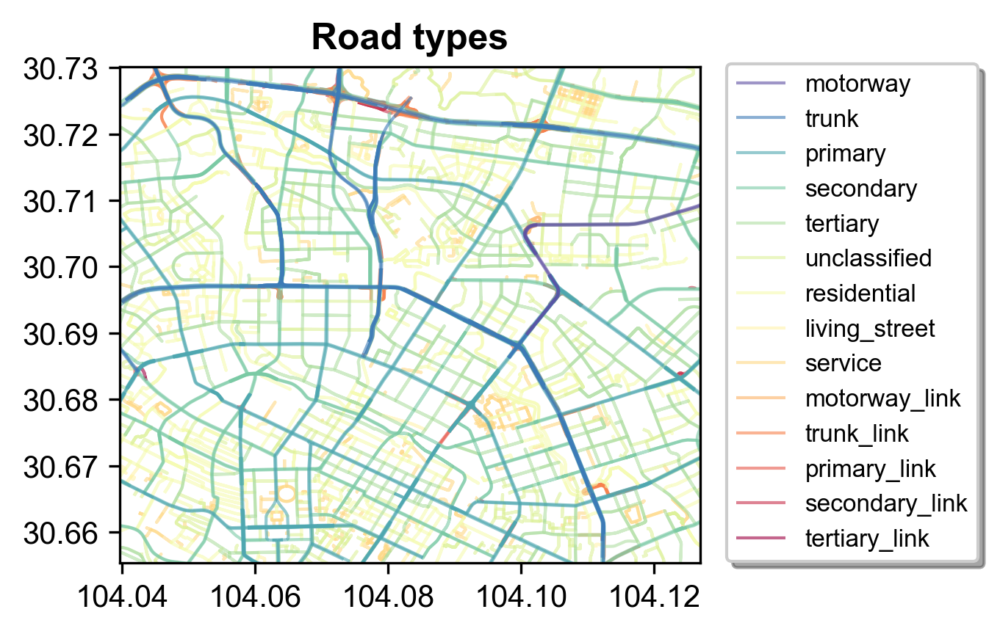

In [33]:
fig, ax = plt.subplots(1,1, figsize=(4,4), constrained_layout=True)

# extract all colors from cmap
cmap = plt.cm.get_cmap('Spectral', 14) # define the colormap
cmaplist = [cmap(i) for i in range(cmap.N)]

roadtypes = reversed(highway_types)
for roadtype, color in zip(roadtypes, cmaplist):
    agg_link[agg_link['road type'] == roadtype].plot(ax=ax, linewidth=1, color=color, alpha=0.6, label=roadtype)

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.set_title('Road types', fontdict=LABEL_FONT)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.5, 1.03), bbox_transform=ax.transAxes, fontsize=8, shadow=True)
plt.show()

### 3.2 Road type aggregation

In [8]:
# # cumulative data
# agg_link_cum = agg_link.copy()
# for col in ['speedMean', 'accMean', 'VSPMean', 'brakeDecelMean']:
#     agg_link_cum[col] = agg_link_cum[col] * agg_link_cum['trajCount']
# agg_type = agg_link_cum[['trajCount', 'brakeCount', 'brakeEventNum', 'mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'OpModeCount', 'road type', 'length']].groupby(by='road type').sum()

# # mean data
# for col in ['speedMean', 'accMean', 'VSPMean', 'brakeDecelMean']:
#     agg_type[col] = agg_type[col] / agg_type['trajCount']

# with open("./data/agg/agg_type.pkl", 'wb') as f:
#     pickle.dump(agg_type, f)

In [14]:
with open("./data/agg/agg_type.pkl", 'rb') as f:
    agg_type = pickle.load(f)

# calculate
agg_type = calParams(agg_type)

# sort
highway_types = ["motorway", "trunk", "primary", "secondary", "tertiary", "unclassified", "residential","living_street",
                 "service", "motorway_link", "trunk_link", "primary_link", "secondary_link", "tertiary_link", ]
agg_type = agg_type.loc[highway_types]
agg_type['trajVol'] = agg_type['trajCount'] / agg_type['length'] * 1000 / 30 / 24 # #/km/h

### 3.3 Intersection aggregation

In [15]:
with open("./data/agg/agg_node.pkl", 'rb') as f:
    agg_node = pickle.load(f)

# calculate parameters
agg_node['brakeEventNum'] = agg_node['brakeEventNum'].astype('float32')
agg_node['brakeCount'] = agg_node['brakeCount'].astype('int32')
agg_node = calParams(agg_node)
agg_node.fillna(value=0, inplace=True)

int_col = ['trajCount', 'brakeCount', 'brakeEventNum']
float_col = ['mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'brakeFrac', 'brakeFreq', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg']
agg_node[int_col] = agg_node[int_col].astype('int32')
agg_node[float_col] = agg_node[float_col].astype('float32')

In [16]:
import geopandas as gpd
nodes = gpd.read_file("./data/geo/nodes/nodes.shp")

# link-level aggregation
agg_node = agg_node.join(nodes.set_index('osmid'))  # add geo info
agg_node = gpd.GeoDataFrame(agg_node, geometry='geometry')  # transfer to gdf
agg_node.fillna(value='unsignalized', inplace=True)
agg_node = agg_node[agg_node['street_cou'] > 1]  # consider >2 links only

agg_node['length'] = agg_node['street_cou'] * 20  # length
agg_node['trajVol'] = agg_node['trajCount'] / agg_node['length'] * 1000 / 30 / 24 # #/km/h

In [17]:
# cumulative data
agg_node_cum = agg_node.copy()
for col in ['speedMean', 'accMean', 'VSPMean', 'brakeDecelMean']:
    agg_node_cum[col] = agg_node_cum[col] * agg_node_cum['trajCount']
agg_node_cum = agg_node_cum[['trajCount', 'brakeCount', 'brakeEventNum', 'mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'OpModeCount', 'length']].sum()

# mean data
for col in ['speedMean', 'accMean', 'VSPMean', 'brakeDecelMean']:
    agg_node_cum[col] = agg_node_cum[col] / agg_node_cum['trajCount']

agg_node_cum['brakeFrac'] = agg_node_cum['brakeCount'] / agg_node_cum['trajCount']
agg_node_cum['brakeFreq'] = agg_node_cum['brakeEventNum'] / agg_node_cum['mileage']
agg_node_cum['brakeTimeMean'] =agg_node_cum['brakeCount'] /agg_node_cum['brakeEventNum']  # sec
agg_node_cum['OpModeFrac'] = agg_node_cum['OpModeCount'] / agg_node_cum['trajCount']
agg_node_cum['brakeDecelMean'] = np.abs(agg_node_cum['brakeDecelMean'])
agg_node_cum['PM10 ER Avg'] = sum(agg_node_cum['OpModeFrac'] * OpModeERs)
agg_node_cum['Daily BWE'] = agg_node_cum['PM10 ER Avg'] * agg_node_cum['trajCount'] / 3600 / 30
agg_node_cum['PM10 EF Avg'] = agg_node_cum['Daily BWE'] * 30 / agg_node_cum['mileage'] * 1000  # mg/km/veh
agg_node_cum['trajVol'] = agg_node_cum['trajCount'] / agg_node_cum['length'] * 1000 / 30 / 24 # #/km/h

cols = ['trajCount', 'brakeCount', 'brakeEventNum', 'mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'OpModeCount', 'brakeFrac', 'brakeFreq', 'brakeTimeMean', 'OpModeFrac', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg', 'trajVol']
agg_type = agg_type[cols]
agg_type.loc['intersection'] = agg_node_cum[cols]

# add to road type aggregation
int_col = ['trajCount', 'brakeCount', 'brakeEventNum']
float_col = ['mileage', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'brakeFrac', 'brakeFreq', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg']
agg_type[int_col] = agg_type[int_col].astype('int32')
agg_type[float_col] = agg_type[float_col].astype('float32')

### Analysis

In [18]:
# # bound
# with open("Z:/Data/NEE_Chengdu/traj/processed/gps_20161101_0.pkl", 'rb') as f:
#     traj = pickle.load(f)
# east, west, north, south = traj['lon'].max(), traj['lon'].min(), traj['lat'].max(), traj['lat'].min(), 
east, west, north, south = 104.1269937640354, 104.03967976411019, 30.73017827690331, 30.655405046818046
east, west, north, south

(104.1269937640354, 104.03967976411019, 30.73017827690331, 30.655405046818046)

In [19]:
# error bars
errors = agg_link[['brakeCount', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'road type', 'brakeFrac', 'brakeFreq', 'brakeTimeMean', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg', 'trajVol']].groupby(by='road type').std()
errors = errors.loc[highway_types]
errors.loc['intersection'] = agg_node[['brakeCount', 'speedMean', 'accMean', 'VSPMean', 'brakeDecelMean', 'brakeFrac', 'brakeFreq', 'brakeTimeMean', 'PM10 ER Avg', 'Daily BWE', 'PM10 EF Avg', 'trajVol']].std()

In [20]:
# sort by value
agg_type = agg_type.sort_values(by='PM10 EF Avg', ascending=True)
errors = errors.loc[agg_type.index]

In [21]:
# average emission per braking
agg_type['Daily BWE'] * 30 / agg_type['brakeEventNum']

road type
trunk             0.002481
motorway          0.002359
motorway_link     0.002311
trunk_link        0.002535
secondary_link    0.002497
primary_link      0.002480
intersection      0.001041
tertiary          0.002361
primary           0.002432
secondary         0.002466
residential       0.002327
service           0.002176
living_street     0.002242
unclassified      0.002285
tertiary_link     0.002263
dtype: float64

In [19]:
agg_type.loc['intersection']

trajCount                                                 990530293
brakeCount                                                337813491
brakeEventNum                                             197877608
mileage                                                   5468295.5
speedMean                                                  19.81056
accMean                                                    0.064412
VSPMean                                                    0.693442
brakeDecelMean                                             0.832122
OpModeCount       [115941579, 233969183, 181349363, 165107242, 8...
brakeFrac                                                  0.341043
brakeFreq                                                  36.18634
brakeTimeMean                                              1.707184
OpModeFrac        [0.11705000828278556, 0.23620598446452562, 0.1...
PM10 ER Avg                                                0.748702
Daily BWE                                       

In [22]:
agg_type.loc[['motorway', 'trunk']].sum() / 2

trajCount                                               110055540.0
brakeCount                                               39973737.5
brakeEventNum                                            10380211.0
mileage                                                1021940.6875
speedMean                                                 33.292099
accMean                                                    0.014046
VSPMean                                                    1.361378
brakeDecelMean                                             0.854484
OpModeCount       [14475520.0, 18681804.0, 14283716.5, 12255213....
brakeFrac                                                  0.373743
brakeFreq                                                 10.430127
brakeTimeMean                                              3.878691
OpModeFrac        [0.13121969746007264, 0.14541116842514593, 0.1...
PM10 ER Avg                                                0.838836
Daily BWE                                       

In [23]:
def type_bar(ax, col, label, color, aggFile):
    ax.barh(aggFile.index, aggFile[col], height=0.5, xerr=errors[col], color=color, zorder=2)
    ax.set_title("%s\n(aggregated by road type)" % (label), fontdict=LABEL_FONT, fontsize=14)
    ax.grid(axis='x', linestyle=":", zorder=0)
    ax.invert_yaxis()

from matplotlib.colors import Normalize
def road_heat(ax, col, label, cmap, vmin, vmax, subID, agg_link):
    """heat map for road"""
    agg_link = agg_link.sort_values(by=col)
    agg_link.plot(ax=ax, column=col, cmap=cmap, linewidth=1, vmin=vmin, vmax=vmax, zorder=0)
    # agg_node.plot(ax=ax, column=col, cmap=cmap, markersize=2, alpha=0.4, vmin=vmin, vmax=vmax, zorder=10)
    ax.set_xlim(west, east)
    ax.set_ylim(south, north)
    if subID:
        ax.set_xlabel(subID, fontdict=LABEL_FONT)
    cbar = fig.colorbar(plt.cm.ScalarMappable(
                            norm=Normalize(vmin, vmax),
                            cmap=cmap),
                        ax=ax, location='right', shrink=0.5, extend='both')
    # cbar.set_label(label=label, fontdict=LABEL_FONT, fontsize=14)


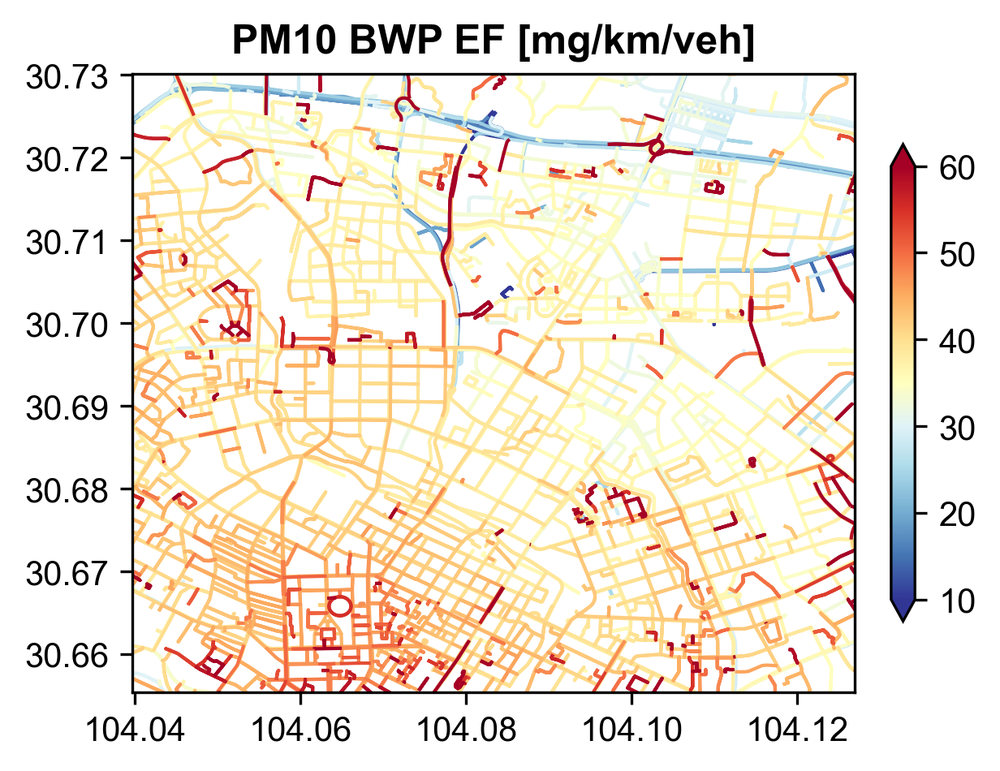

In [24]:
fig, ax = plt.subplots(1,1, figsize=(4,4), constrained_layout=True)

### EF heat ###
road_heat(ax, 'PM10 EF Avg', 'PM10 BWP EF [mg/vkm]', 'RdYlBu_r', 10, 60, None, agg_link)
# ax.text(-0.3, 1, "(a)", transform=ax.transAxes, fontdict=LABEL_FONT, fontsize=15)
ax.set_title('PM10 BWP EF [mg/km/veh]', fontdict=LABEL_FONT)
plt.show()

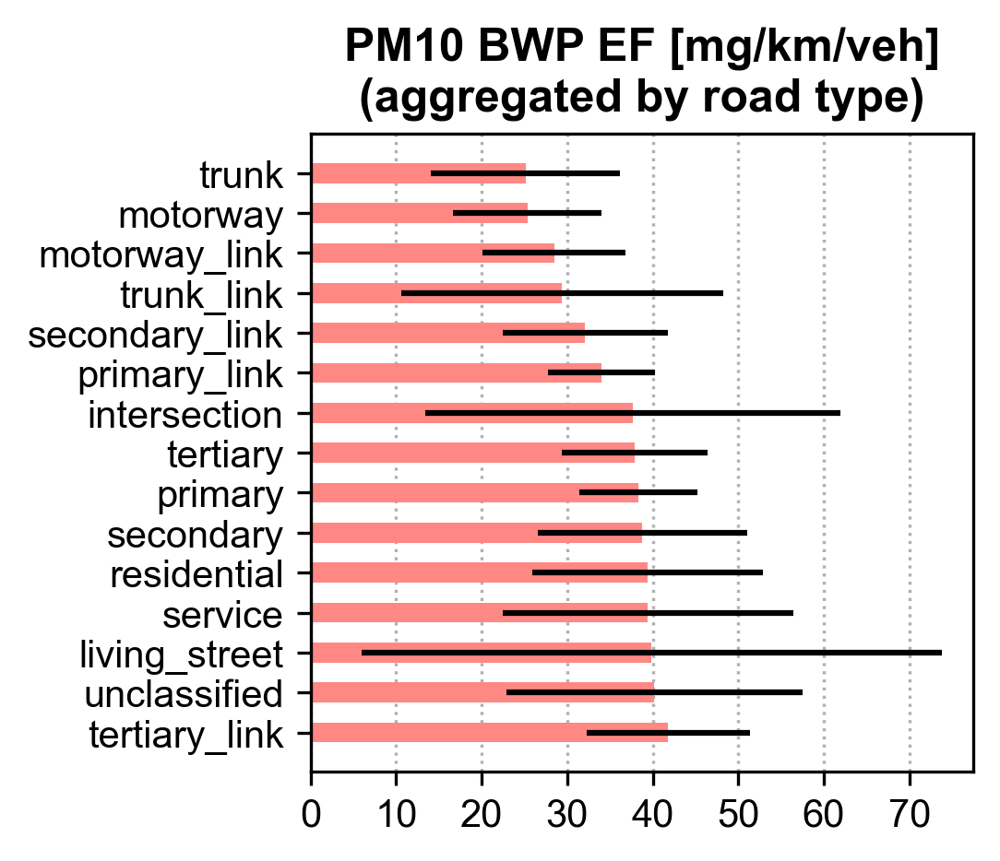

In [103]:
fig, ax = plt.subplots(1,1, figsize=(3.5,3), constrained_layout=True)

### EF bar ###
type_bar(ax, 'PM10 EF Avg', 'PM10 BWP EF [mg/vkm]', PINK,  agg_type)
ax.set_xticks(np.arange(0,80,10), np.arange(0,80,10))
ax.set_title('PM10 BWP EF [mg/km/veh]\n(aggregated by road type)', fontdict=LABEL_FONT)
ax.set_xlabel('')
plt.show()

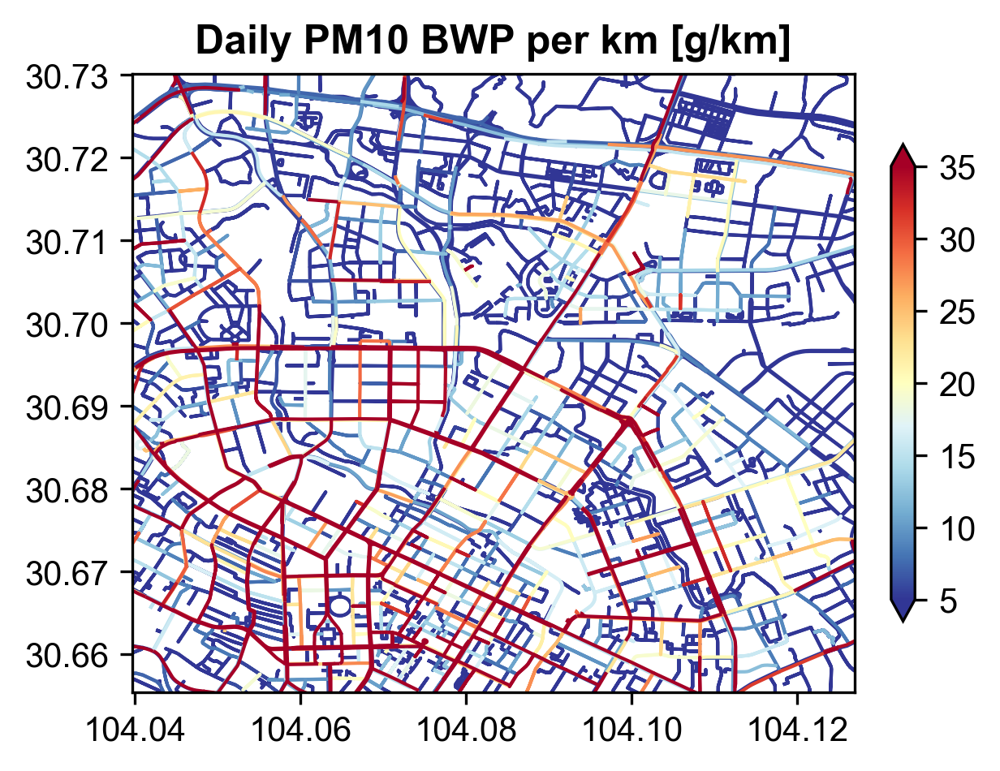

In [25]:
agg_link['BWE per km'] = agg_link['Daily BWE'] / agg_link['length'] * 1000

fig, ax = plt.subplots(1,1, figsize=(4,4), constrained_layout=True)

### EF heat ###
road_heat(ax, 'BWE per km', 'Daily BWP per km [g/km]', 'RdYlBu_r', 5, 35, None, agg_link)
# ax.text(-0.3, 1, "(b)", transform=ax.transAxes, fontdict=LABEL_FONT, fontsize=15)
ax.set_title('Daily PM10 BWP per km [g/km]', fontdict=LABEL_FONT)
plt.show()

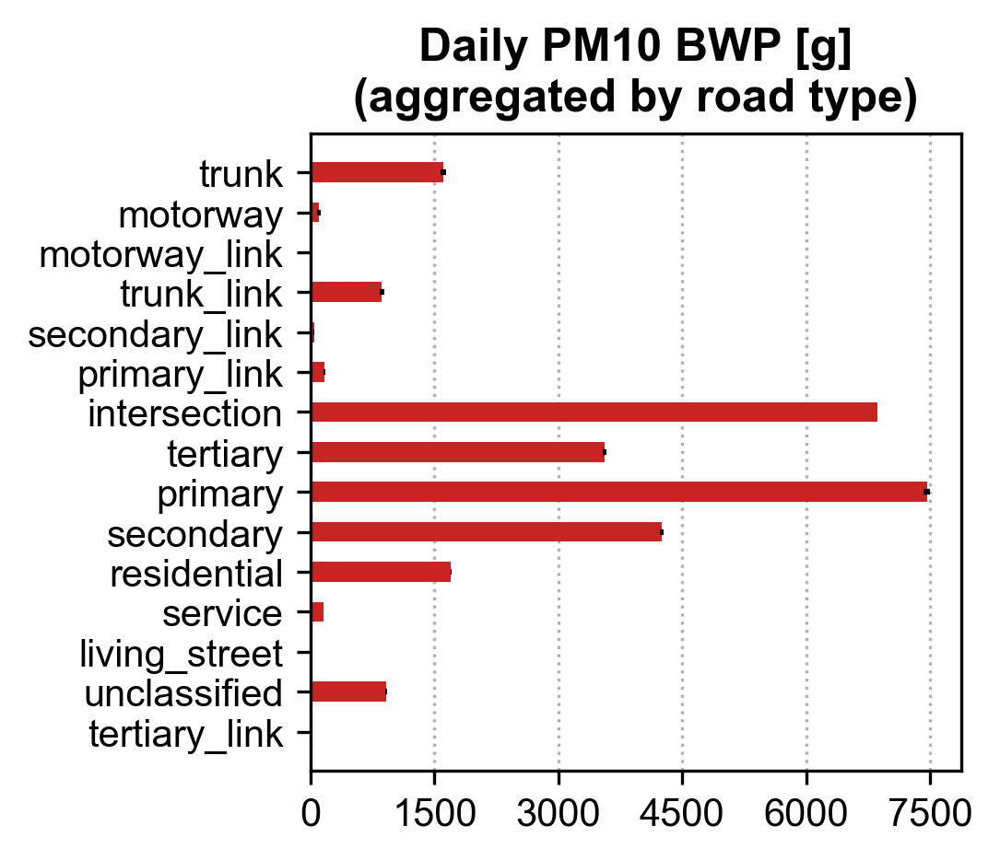

In [104]:
fig, ax = plt.subplots(1,1, figsize=(3.5,3), constrained_layout=True)

### EF bar ###
type_bar(ax, 'Daily BWE', 'Daily PM10 BWE [g]', RED, agg_type)
ax.set_xticks(np.arange(0,8000,1500), np.arange(0,8000,1500))
ax.set_title('Daily PM10 BWP [g]\n(aggregated by road type)', fontdict=LABEL_FONT)
ax.set_xlabel('')
plt.show()

In [26]:
DailyBWENode = agg_node['Daily BWE'].sum()
DailyBWESum = agg_link['Daily BWE'].sum()
DailyBWENode / DailyBWESum

0.32893667

BWP emissions from intersections account up to 32.89% of the total.

In [27]:
# trajectory per hour
agg_type['trajVol_hour'] = agg_type['trajCount'] / 30 / 24 / 1000  # #/h thousand
agg_type['trajVol_hour'].describe()

count      15.000000
mean      366.135720
std       505.565686
min         1.215208
25%        13.090774
50%       146.175432
75%       531.361712
max      1487.150804
Name: trajVol_hour, dtype: float64

In [107]:
def road_heat(ax, col, label, cmap, vmin, vmax, subID, agg_link):
    """heat map for road"""
    agg_link = agg_link.sort_values(by=col)
    agg_link.plot(ax=ax, column=col, cmap=cmap, linewidth=1, vmin=vmin, vmax=vmax, zorder=0)
    # agg_node.plot(ax=ax, column=col, cmap=cmap, markersize=2, alpha=0.4, vmin=vmin, vmax=vmax, zorder=10)
    ax.set_xlim(west, east)
    ax.set_ylim(south, north)
    cbar = fig.colorbar(plt.cm.ScalarMappable(
                            norm=Normalize(vmin, vmax),
                            cmap=cmap),
                        ax=ax, location='right', shrink=0.8, extend='both')
    # cbar.set_label(label=label, fontdict=LABEL_FONT, fontsize=14)
    # ax.text(-0.28, 1, subID, transform=ax.transAxes, fontdict=LABEL_FONT, fontsize=20)
    ax.set_title(label, fontdict=LABEL_FONT, fontsize=16)

def type_bar(ax, col, label, color, aggFile, error=True):
    if error:
        ax.barh(aggFile.index, aggFile[col], height=0.5, xerr=errors[col], color=color, zorder=2)
    else:
        ax.barh(aggFile.index, aggFile[col], height=0.5, color=color, zorder=2)
    ax.set_xlabel("%s\n(aggregated by road type)" % (label), fontdict=LABEL_FONT, fontsize=16)
    ax.tick_params(axis='y', labelsize=14)
    ax.grid(axis='x', linestyle=":", zorder=0)
    ax.invert_yaxis()

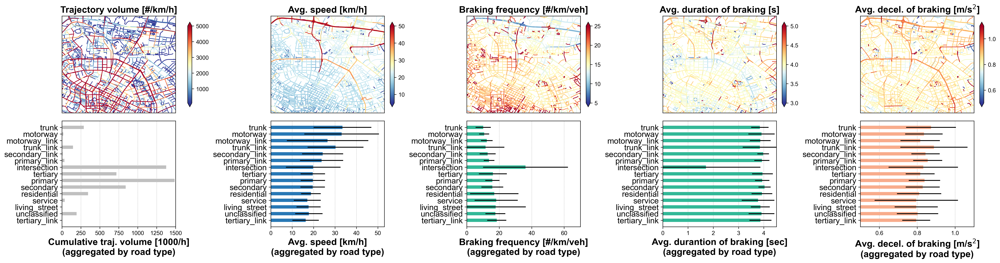

In [108]:
fig, ax = plt.subplots(2,5, figsize=(24,6.3), constrained_layout=True)
# fig, ax = plt.subplots(2,5, figsize=(20,5.5), constrained_layout=True)
ax = ax.flatten()

i=0
### Traj vol heat ###
road_heat(ax[i], 'trajVol', 'Trajectory volume [#/km/h]', 'RdYlBu_r', 100, 5000, "(c)", agg_link)

i += 1
### Avg speed heat ###
road_heat(ax[i], 'speedMean', 'Avg. speed [km/h]', 'RdYlBu_r', 5, 50, "(d)", agg_link)

i += 1
### brake freq heat ###
road_heat(ax[i], 'brakeFreq', 'Braking frequency [#/km/veh]', 'RdYlBu_r', 5, 25, "(e)", agg_link)

i += 1
### brake freq heat ###
road_heat(ax[i], 'brakeTimeMean', 'Avg. duration of braking [s]', 'RdYlBu_r', 3, 5, "(f)", agg_link)

i += 1
### Avg decel heat ###
road_heat(ax[i], 'brakeDecelMean', 'Avg. decel. of braking [m/s$^2$]', 'RdYlBu_r', 0.5, 1.1, "(g)", agg_link)

i += 1
### traj vol bar ###
type_bar(ax[i], 'trajVol_hour', 'Cumulative traj. volume [1000/h]', GREY, agg_type, error=False)
ax[i].set_xlim(0, 1500)

i += 1
### Avg speed bar ###
type_bar(ax[i], 'speedMean', 'Avg. speed [km/h]', BLUE, agg_type)
ax[i].set_xlim(0,)

i += 1
### brake freq bar ###
type_bar(ax[i], 'brakeFreq', 'Braking frequency [#/km/veh]', DEEPGREEN, agg_type)
ax[i].set_xlim(0, 70)

i += 1
### brake freq bar ###
type_bar(ax[i], 'brakeTimeMean', 'Avg. durantion of braking [sec]', GREEN, agg_type)
ax[i].set_xlim(0, 4.5)

i += 1
### Avg speed bar ###
type_bar(ax[i], 'brakeDecelMean', 'Avg. decel. of braking [m/s$^2$]', ORANGE, agg_type)
ax[i].set_xlim(0.5, 1.1)

for ax_ in [ax[i] for i in range(5)]:
    ax_.set_xticks([])
    ax_.set_yticks([])
plt.show()

## 4 Emission Hotspots

We obtain POI from `osmnx`.

In [28]:
import osmnx as ox

In [29]:
residential_tags = {
    # 'building': ['apartments', 'detached', 'dormitory', 'house', 'residential', 'terrace'],
    'landuse': ['residential']
}
residential_gdf = ox.features_from_bbox(north, south, east, west, residential_tags)

In [30]:
commercial_tags = {
    # 'building': ['hotel', 'commercial', 'office', 'retail', 'supermarket', 'bank'],
    'landuse': ['commercial', 'retail']
}
commercial_gdf = ox.features_from_bbox(north, south, east, west, commercial_tags)

In [31]:
education_tags = {
    'amenity': ['college', 'kindergarten', 'school', 'university'],
    'building': ['college', 'school', 'university'],
    'landuse': ['education']
}
education_gdf = ox.features_from_bbox(north, south, east, west, education_tags)

In [32]:
healthcare_tags = {
    'amenity': ['clinic', 'dentist', 'hospital', 'pharmacy'],
    'building': ['hospital']
}
healthcare_gdf = ox.features_from_bbox(north, south, east, west, healthcare_tags)

In [34]:
# colors
RESIDENTIAL = '#2878B5'
HEALTHCARE = '#DAA520'
EDUCATION = '#32B897'
COMMERCIAL = '#87CEEB'

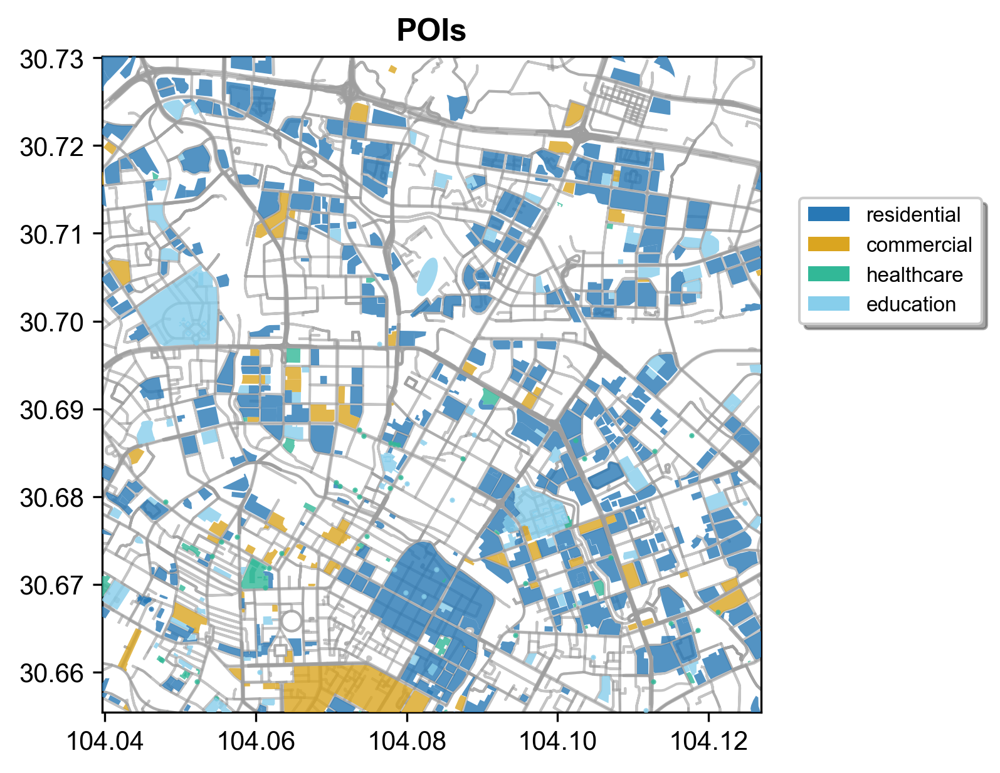

In [35]:
from matplotlib.patches import Patch

fig, ax = plt.subplots(1,1, figsize=(5,4), constrained_layout=True)
# road map
agg_link.plot(ax=ax, linewidth=1, color=GREY, alpha=0.6, zorder=0)

poi_gdfs = [residential_gdf, commercial_gdf, healthcare_gdf, education_gdf]
pois = ['residential', 'commercial', 'healthcare', 'education']
colors = [RESIDENTIAL, HEALTHCARE, EDUCATION, COMMERCIAL]
for poi, poi_gdf, color in zip(pois, poi_gdfs, colors):
    poi_gdf.plot(ax=ax, color=color, linewidth=1, markersize=1, alpha=0.8, zorder=10, label=poi)

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.set_title('POIs', fontdict=LABEL_FONT)

legend_elements = [Patch(facecolor=color, edgecolor='none', label=poi) for color, poi in zip(colors, pois)]
ax.legend(handles=legend_elements, bbox_to_anchor=(1.35, 0.8), bbox_transform=ax.transAxes, fontsize=8, shadow=True)
plt.show()

### Grid analysis

In [37]:
from shapely import geometry

minX, minY, maxX, maxY =  west, south, east, north
x, y = (minX, minY)

geom_array = []

# hex grid
honeycomb_size = 0.008
i = 1
while y <= maxY:
    while x <= maxX:
        geom = geometry.Polygon([(x,y-honeycomb_size), 
                                 (x+pow(3,0.5)/2*honeycomb_size, y-0.5*honeycomb_size), 
                                 (x+pow(3,0.5)/2*honeycomb_size, y+0.5*honeycomb_size), 
                                 (x,y+honeycomb_size),
                                 (x-pow(3,0.5)/2*honeycomb_size, y+0.5*honeycomb_size),
                                 (x-pow(3,0.5)/2*honeycomb_size, y-0.5*honeycomb_size), 
                                 (x,y-honeycomb_size)])
        geom_array.append(geom)
        x += pow(3,0.5)*honeycomb_size
    i += 1
    y += 1.5*honeycomb_size
    if i % 2 == 0:   
        x = minX + pow(3,0.5)/2*honeycomb_size
    else:
        x = minX
square = gpd.GeoDataFrame(geometry = geom_array,
                             crs = agg_link.crs)

# aggregate and merge
agg_grid_merge = gpd.sjoin(agg_link[['geometry', 'Daily BWE']], square, how='left', op='within')
agg_grid = agg_grid_merge.dissolve(by='index_right', aggfunc='sum')
agg_grid['geometry'] = square['geometry']

d:\Software\Anaconda3\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


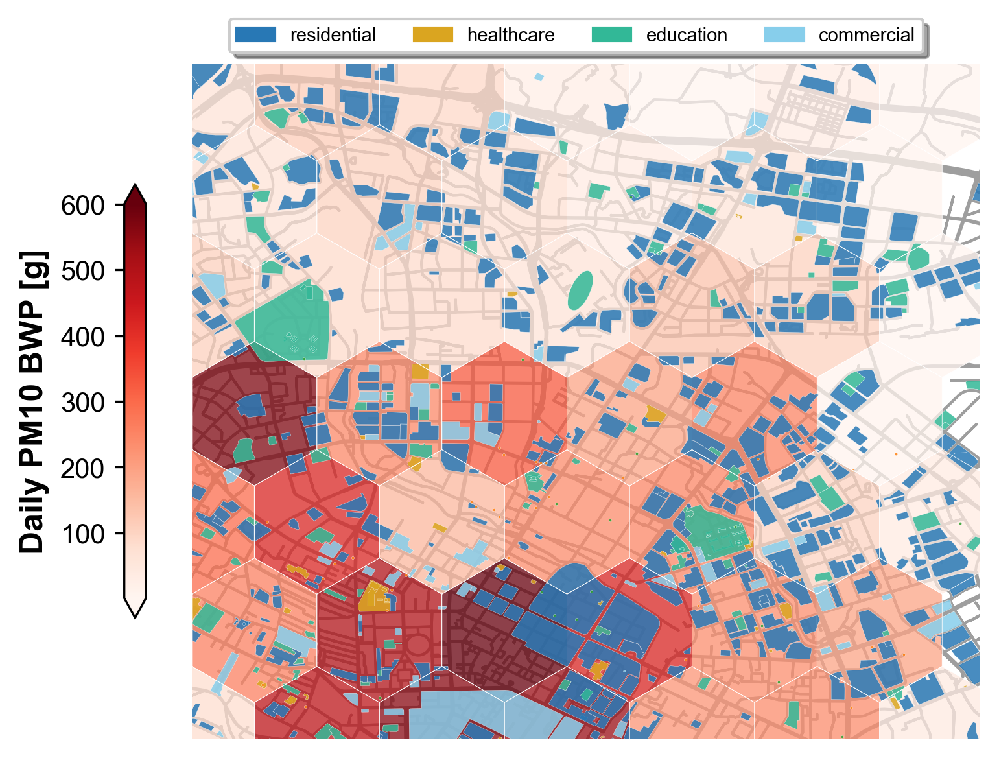

In [38]:
from matplotlib.patches import Patch

fig, ax = plt.subplots(1,1, figsize=(5,4), constrained_layout=True)

# road map
agg_link.plot(ax=ax, linewidth=1, color=GREY, alpha=1., zorder=5)

# POI
poi_gdfs = [residential_gdf, healthcare_gdf, education_gdf, commercial_gdf]
pois = ['residential', 'healthcare', 'education', 'commercial']
colors = [RESIDENTIAL, HEALTHCARE, EDUCATION, COMMERCIAL]
for poi, poi_gdf, color in zip(pois, poi_gdfs, colors):
    # poi_gdf.plot(ax=ax, facecolor=color, edgecolor='k', linewidth=0.3, markersize=1, alpha=.9, zorder=10, label=poi)
    poi_gdf.plot(ax=ax, facecolor=color, edgecolor='white', linewidth=0.1, markersize=1, alpha=.85, zorder=10, label=poi)

legend_elements = [Patch(facecolor=color, edgecolor=color, label=poi) for color, poi in zip(colors, pois)]
ax.legend(handles=legend_elements, bbox_to_anchor=(0.94, 1.08), bbox_transform=ax.transAxes, ncol=4, fontsize=7, shadow=True)

# grid
vmin, vmax = agg_grid['Daily BWE'].min(), agg_grid['Daily BWE'].max()
label = 'Daily PM10 BWP [g]'
cmap='Reds'
agg_grid.plot(ax=ax, column='Daily BWE', edgecolor='white', linewidth=0.0, cmap=cmap, vmin=vmin, vmax=600, alpha=0.75, zorder=5)
agg_grid.plot(ax=ax, edgecolor='white', facecolor='none', linewidth=0.2, zorder=15)
cbar = fig.colorbar(plt.cm.ScalarMappable(
                        norm=Normalize(vmin, 600),
                        cmap=cmap),
                    ax=ax, location='left', shrink=0.6, extend='both')
cbar.set_label(label=label, fontdict=LABEL_FONT, fontsize=12)

ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.axis('off')
plt.show()

In [40]:
# get number of POI in each grid
square = gpd.GeoDataFrame(geometry = geom_array, crs = 'epsg:4326')

residential_gdf['num'] = 1
gird_residential = gpd.sjoin(residential_gdf[['geometry', 'num']], square, how='left', op='within')
gird_residential = gird_residential.dissolve(by='index_right', aggfunc='sum')

commercial_gdf['num'] = 1
gird_commercial = gpd.sjoin(commercial_gdf[['geometry', 'num']], square, how='left', op='within')
gird_commercial = gird_commercial.dissolve(by='index_right', aggfunc='sum')

education_gdf['num'] = 1
gird_education = gpd.sjoin(education_gdf[['geometry', 'num']], square, how='left', op='within')
gird_education = gird_education.dissolve(by='index_right', aggfunc='sum')

healthcare_gdf['num'] = 1
gird_healthcare = gpd.sjoin(healthcare_gdf[['geometry', 'num']], square, how='left', op='within')
gird_healthcare = gird_healthcare.dissolve(by='index_right', aggfunc='sum')

# calculate num
agg_grid['residential_num'] = gird_residential['num']
agg_grid['commercial_num'] = gird_commercial['num']
agg_grid['education_num'] = gird_education['num']
agg_grid['healthcare_num'] = gird_healthcare['num']
agg_grid['poi_num'] = agg_grid['residential_num'] + agg_grid['commercial_num'] + agg_grid['education_num'] + agg_grid['healthcare_num']
agg_grid.fillna(0, inplace=True)

d:\Software\Anaconda3\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
d:\Software\Anaconda3\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
d:\Software\Anaconda3\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
d:\Software\Anaconda3\envs\geo\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release

In [41]:
# fit linear model (poi-bwe)
from scipy.stats import linregress as LR

lines = {poi:None for poi in pois}
y = agg_grid['Daily BWE']
for poi in pois:
    x = agg_grid['%s_num'%poi]
    lines[poi] = LR(x, y, 'greater')

x = agg_grid['poi_num']
lines['poi'] = LR(x, y, 'greater')

In [42]:
# p-value
for line in lines.values():
    print(line.pvalue)

0.31072236403075393
0.0003782226435694062
0.18957927940966496
0.0031101935807544092
0.0015967581611290385


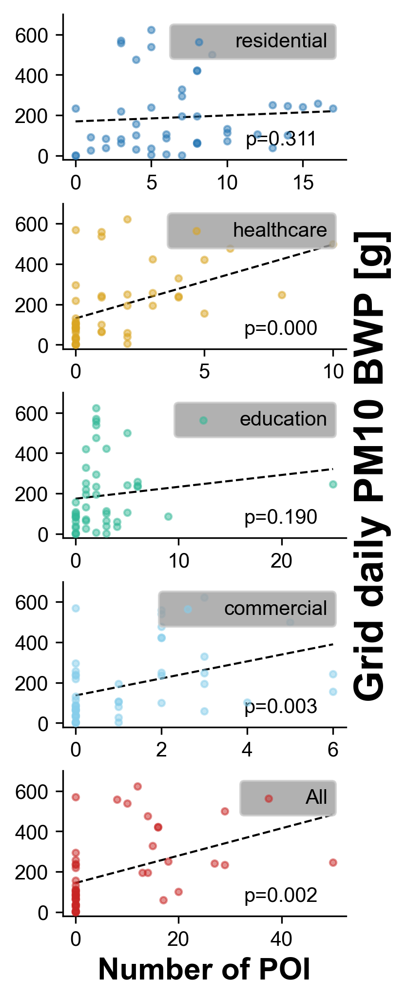

In [44]:
fig, ax = plt.subplots(5,1,figsize=(2.5,8))
ax = ax.flatten()
fig.subplots_adjust(hspace=0.3)

colors = [RESIDENTIAL, HEALTHCARE, EDUCATION, COMMERCIAL, RED]
for i, poi in enumerate(lines.keys()):
    x = np.arange(agg_grid['%s_num'%poi].min(), agg_grid['%s_num'%poi].max()+0.5, 0.5)
    ax[i].plot(x, lines[poi].intercept + lines[poi].slope*x, linewidth=1, linestyle='--', color='k')
    ax[i].scatter(agg_grid['%s_num'%poi], agg_grid['Daily BWE'], marker='o', c=colors[i], s=10, alpha=0.5, label=poi if i<4 else "All", zorder=10)
    ax[i].text(0.9, 0.1, 'p=%.3f' % lines[poi].pvalue, transform = ax[i].transAxes, ha='right')

    ax[i].set_yticks(np.arange(0,700,200))
    ax[i].set_ylim(-20,700)
    ax[i].legend(loc=1, fontsize=10, facecolor=GREY).set_zorder(20)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

ax[4].set_xlabel("Number of POI", fontdict=LABEL_FONT, fontsize=15)
ax[2].yaxis.set_label_position("right")
ax[2].set_ylabel("Grid daily PM10 BWP [g]", fontdict=LABEL_FONT, fontsize=20)
plt.show()